## Методические указания по выполнению лабораторной работы №4

**Тема: Сегментация объектов с использованием Mask R-CNN**

**Цель работы:** Познакомиться с архитектурой Mask R-CNN и научиться выполнять сегментацию объектов на изображениях.

**Задачи:**

- Изучить теоретические основы instance segmentation.
- Ознакомиться с архитектурой Mask R-CNN.
- Провести инференс предобученной модели на выбранных изображениях.
- Визуализировать результаты: bounding boxes, маски объектов.
- Рассчитать метрики оценки качества масок.
- Проанализировать ошибки сегментации.
- Провести исследование зависимости качества от параметров confidence score и mask threshold.

### 1. Теоретическая часть

В данной лабораторной работе мы познакомимся с задачей детекции на примере архитектуры [Mask R-CNN](https://arxiv.org/pdf/1703.06870), обученной на наборе данных [COCO](https://cocodataset.org/#home), а также с новой задачей компьютерного зрения - сегментацией.

**Перед тем, как приступать к выполнению практической части, ознакомьтесь с первоисточниками используемых компонентов, а также документацией по [ссылке](https://pytorch.org/vision/main/models/mask_rcnn.html), включающей подробности работы с моделью и новым форматом данных, сэмплы кода.**

#### 1.1 Instance Segmentation и архитектура Mask R-CNN

Instance segmentation — это задача, в которой необходимо не только обнаружить объект и его класс, но и сегментировать его границы на уровне пикселей. Это усложнённая версия задачи детекции, так как bounding box не всегда точно соответствует форме объекта.

В отличие от semantic segmentation, где модель выдает одну маску на класс, в instance segmentation выделяется каждый объект независимо, даже если они относятся к одному классу.

Mask R-CNN — это расширение Faster R-CNN, дополненное ещё одним выходом: бинарной маской для каждого обнаруженного объекта.

Архитектура Mask R-CNN включает:

1. Backbone (например, ResNet-50) — извлекает карты признаков из изображения.
2. Region Proposal Network (RPN) — предлагает кандидаты на объекты.
3. ROI Align / ROI Pooling — извлекает фиксированные области из фичей.
4. Bounding Box Head — классифицирует объект и уточняет координаты.
5. Mask Head — предсказывает маску для каждого класса, соответствующую bounding box.


#### 1.2 Формат данных для задачи детекции

При запуске инференса модель возвращает словарь с результатами: координаты bounding boxes, классы объектов, confidence score и маски объектов (представлены как float значения от 0 до 1).

В рамках выполнения работы в зависимости от варианта вам предстоит познакомиться с другими форматами файлов и их содержимым.

### Варианты

Выполните задание в соответствии со своим вариантом по списку с использованием предобученной модели.

**Вариант 1  - Pascal VOC 2007. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс модели на 20 изображениях;
- Визуализировать bounding boxes и маски;
- Проанализировать качество предсказаний;
- Описать, какие классы модель распознала, какие пропустила.

**Вариант 2 — COCO 2017. Сравнить предсказания модели с реальной разметкой и провести количественную оценку:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;

**Вариант 3 — Cityscapes. Проверить, как модель работает на новых изображениях, визуализировать предсказания и сравнить с известными аннотациями:**

- Выполнить инференс на 20 изображениях;
- Визуализировать предсказания;
- Сравнить полученные маски с ground truth;
- Рассчитать IoU, Pixel Accuracy или Precision/Recall;


### 2. Практическая часть

#### 2.1 Подготовка окружения

Установите зависимости и библиотеки:

In [27]:
import torch
import torchvision
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
from torchvision.transforms import functional as F
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks

import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import json
import os
import random
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask

import cv2
from sklearn.metrics import precision_score, recall_score, accuracy_score


#### 2.2 Подготовка модели

Загрузите предобученную модель, определите устройство, переведите модель в режим инференса:

In [28]:
def get_model(num_classes=91):
    # Загрузка модели, предобученной на COCO
    model = maskrcnn_resnet50_fpn(pretrained=True)

    # Перевод модели в режим оценки
    model.eval()
    return model

# Определение устройства (GPU/CPU)
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f"Используется устройство: {device}")

# Загрузка модели
model = get_model()
model.to(device)


Используется устройство: cpu


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

#### 2.3 Загрузка и предобработка изображений


Затем импортируйте датасет из соответствующих пакетов PyTorch и определите метод трансформации данных для подачи в модель:

In [12]:
!mkdir -p coco_data
!wget -nc http://images.cocodataset.org/zips/val2017.zip -P coco_data/
!wget -nc http://images.cocodataset.org/annotations/annotations_trainval2017.zip -P coco_data/

# Распаковка
!unzip -q -o coco_data/val2017.zip -d coco_data/
!unzip -q -o coco_data/annotations_trainval2017.zip -d coco_data/

# Пути к данным
data_dir = "coco_data"
image_dir = os.path.join(data_dir, "val2017")
annotation_file = os.path.join(data_dir, "annotations", "instances_val2017.json")

# Инициализация COCO API
coco = COCO(annotation_file)

# Получение всех изображений
image_ids = coco.getImgIds()
print(f"Всего изображений в датасете: {len(image_ids)}")

# Выбор 20 случайных изображений
selected_image_ids = random.sample(image_ids, 20)
print(f"Выбрано {len(selected_image_ids)} изображений для анализа")

# Категории COCO
categories = coco.loadCats(coco.getCatIds())
category_names = [cat['name'] for cat in categories]
print(f"Количество классов в COCO: {len(category_names)}")

--2025-09-30 19:25:27--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.15.217.115, 16.15.193.61, 3.5.28.209, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.15.217.115|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘coco_data/val2017.zip’

val2017.zip         100%[===================>] 777.80M  95.4MB/s    in 8.1s    

2025-09-30 19:25:35 (95.7 MB/s) - ‘coco_data/val2017.zip’ saved [815585330/815585330]

--2025-09-30 19:25:35--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.15.180.32, 52.216.245.4, 3.5.30.211, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.15.180.32|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘coco_data/annotations_trainval2017.zip

#### 2.4 Предсказания и извлечение масок

Если вы работаете с Pascal VOC, вам потребуется прочитать файлы, содержащие разметку. Если вы работаете с COCO или Cityscapes, аннотации читаются через готовые методы COCO API:

In [38]:
# 2.4 Предсказания и извлечение масок - методы извлечения меток и визуализации
def preprocess_image(image_path):
    """Предобработка изображения для модели"""
    image = Image.open(image_path).convert("RGB")
    image_tensor = F.to_tensor(image)
    return image_tensor, image

def get_predictions(model, image_tensor, device, confidence_threshold=0.5):
    """Получение предсказаний от модели"""
    with torch.no_grad():
        prediction = model([image_tensor.to(device)])
    return prediction[0]

def filter_predictions(predictions, confidence_threshold=0.5):
    """Фильтрация предсказаний по confidence threshold"""
    mask = predictions['scores'] > confidence_threshold
    filtered_predictions = {}
    for key in predictions:
        filtered_predictions[key] = predictions[key][mask]
    return filtered_predictions

def get_ground_truth_masks(coco, image_id):
    """Получение ground truth масок для изображения"""
    ann_ids = coco.getAnnIds(imgIds=image_id)
    anns = coco.loadAnns(ann_ids)

    gt_masks = []
    gt_boxes = []
    gt_categories = []

    for ann in anns:
        if 'segmentation' in ann:
            # Преобразование COCO формата в бинарную маску
            rle = coco.annToRLE(ann)
            mask = coco_mask.decode(rle)
            gt_masks.append(mask)
            gt_boxes.append(ann['bbox'])
            gt_categories.append(ann['category_id'])

    return gt_masks, gt_boxes, gt_categories

def calculate_iou(mask1, mask2):
    """Вычисление IoU между двумя масками"""
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return intersection / union if union > 0 else 0

def get_category_name(category_id, categories_dict):
    """Безопасное получение имени категории"""
    return categories_dict.get(category_id, f'class_{category_id}')

def visualize_results(image, predictions, gt_masks=None, gt_boxes=None, gt_categories=None):
    """Визуализация предсказаний и ground truth"""
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Конвертируем тензор изображения для визуализации
    if isinstance(image, torch.Tensor):
        image_vis = image.cpu().permute(1, 2, 0).numpy()
    else:
        image_vis = np.array(image)

    # Создаем словарь для соответствия id -> имя категории
    categories_dict = {cat['id']: cat['name'] for cat in categories}

    # Визуализация предсказаний
    pred_image = image_vis.copy()

    # Рисуем bounding boxes предсказаний
    if len(predictions['boxes']) > 0:
        boxes = predictions['boxes'].cpu().numpy()
        scores = predictions['scores'].cpu().numpy()
        labels = predictions['labels'].cpu().numpy()

        for i, (box, score, label) in enumerate(zip(boxes, scores, labels)):
            if score > 0.5:  # Визуализируем только уверенные предсказания
                x1, y1, x2, y2 = box.astype(int)
                cv2.rectangle(pred_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Безопасное получение имени категории
                category_name = get_category_name(label, categories_dict)
                cv2.putText(pred_image, f'{category_name}: {score:.2f}',
                           (x1, max(y1-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    axes[0].imshow(pred_image)
    axes[0].set_title('Predictions')
    axes[0].axis('off')

    # Визуализация ground truth
    gt_image = image_vis.copy()
    if gt_boxes and gt_categories:
        for i, (box, cat_id) in enumerate(zip(gt_boxes, gt_categories)):
            x, y, w, h = [int(coord) for coord in box]
            cv2.rectangle(gt_image, (x, y), (x+w, y+h), (255, 0, 0), 2)

            # Безопасное получение имени категории
            category_name = get_category_name(cat_id, categories_dict)
            cv2.putText(gt_image, category_name,
                       (x, max(y-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    axes[1].imshow(gt_image)
    axes[1].set_title('Ground Truth')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

#### 2.5 Оценка модели и визуализация результатов

Визуализируйте bounding box, название класса, маску поверх изображения. Для каждой маски и её соответствующего ground truth (если имеется), вычислите: IoU, количество FP пикселей, количество FN пикселей:

Загружено категорий: 80
Примеры категорий: [(1, 'person'), (2, 'bicycle'), (3, 'car'), (4, 'motorcycle'), (5, 'airplane')]

--- Обработка изображения 1/20 ---
Изображение: 000000115118.jpg


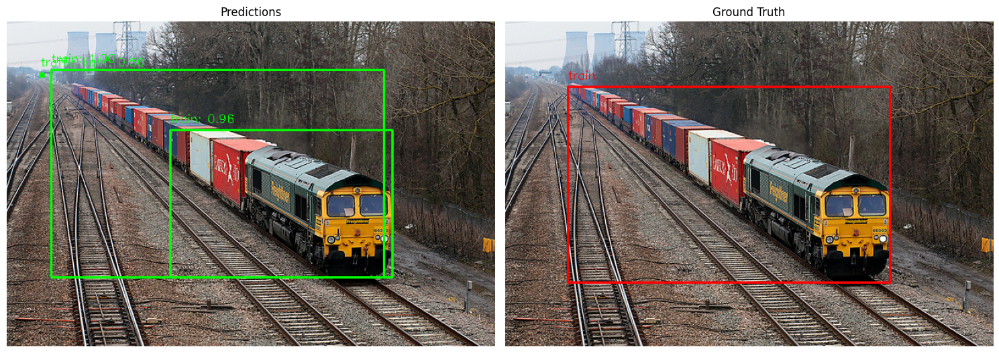

Средние метрики для изображения: IoU: 0.847, Precision: 0.967, Recall: 0.874
Обнаружено объектов: 3
Классы предсказаний: ['train', 'train', 'traffic light']
Ground truth объектов: 1
Классы GT: ['train']

--- Обработка изображения 2/20 ---
Изображение: 000000557501.jpg


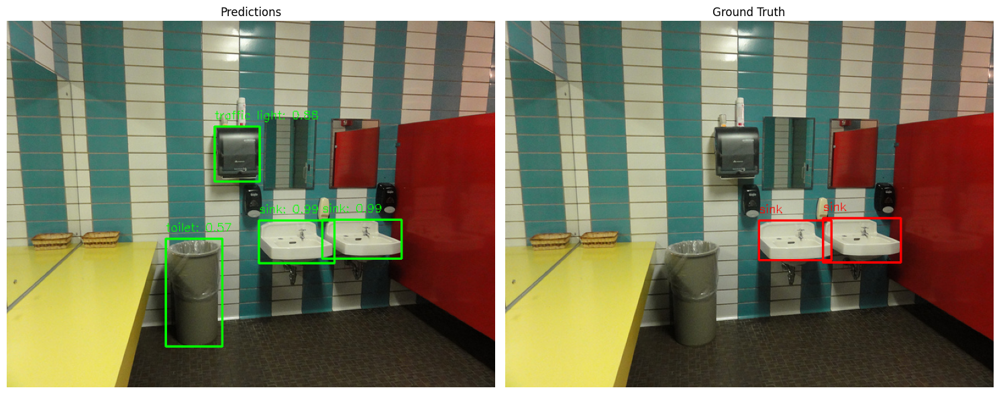

Средние метрики для изображения: IoU: 0.917, Precision: 0.971, Recall: 0.945
Обнаружено объектов: 4
Классы предсказаний: ['sink', 'sink', 'traffic light', 'toilet']
Ground truth объектов: 2
Классы GT: ['sink', 'sink']

--- Обработка изображения 3/20 ---
Изображение: 000000345941.jpg


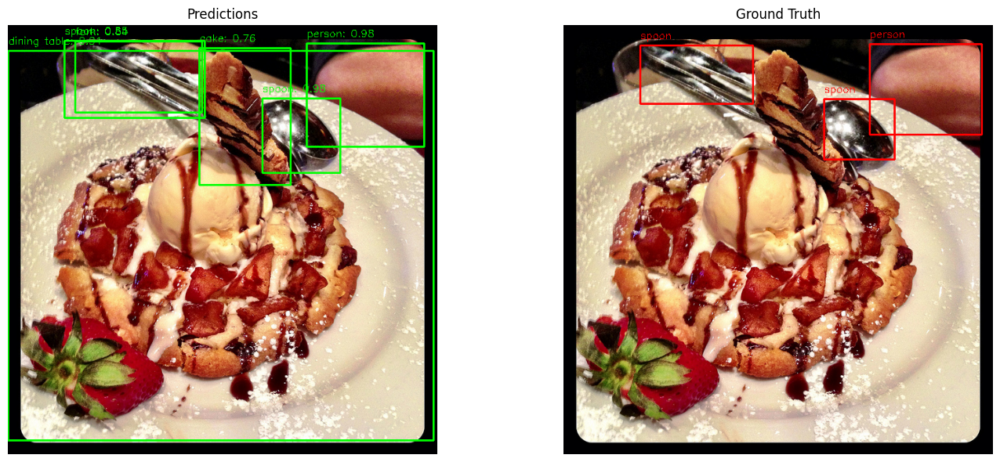

Средние метрики для изображения: IoU: 0.541, Precision: 0.551, Recall: 0.986
Обнаружено объектов: 6
Классы предсказаний: ['person', 'spoon', 'dining table', 'cake', 'fork', 'spoon']
Ground truth объектов: 3
Классы GT: ['spoon', 'spoon', 'person']

--- Обработка изображения 4/20 ---
Изображение: 000000562229.jpg


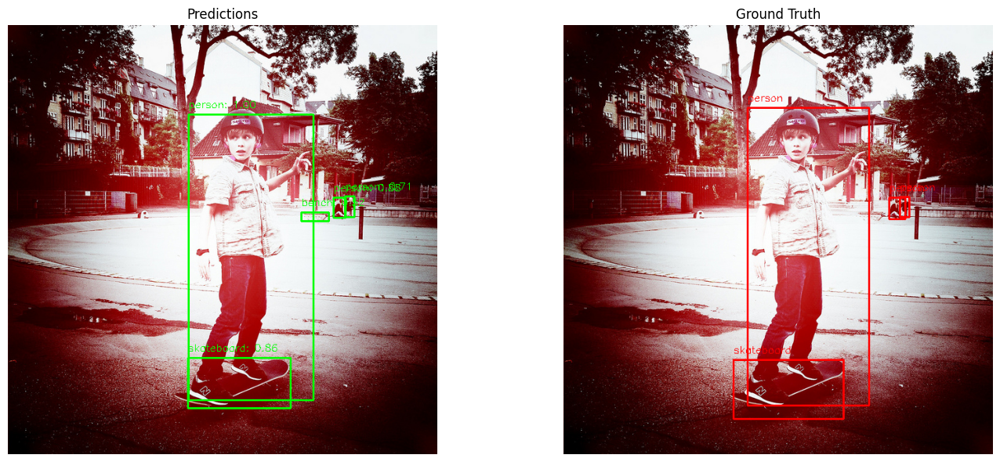

Средние метрики для изображения: IoU: 0.632, Precision: 0.827, Recall: 0.707
Обнаружено объектов: 5
Классы предсказаний: ['person', 'person', 'skateboard', 'person', 'bench']
Ground truth объектов: 4
Классы GT: ['person', 'person', 'skateboard', 'person']

--- Обработка изображения 5/20 ---
Изображение: 000000001000.jpg


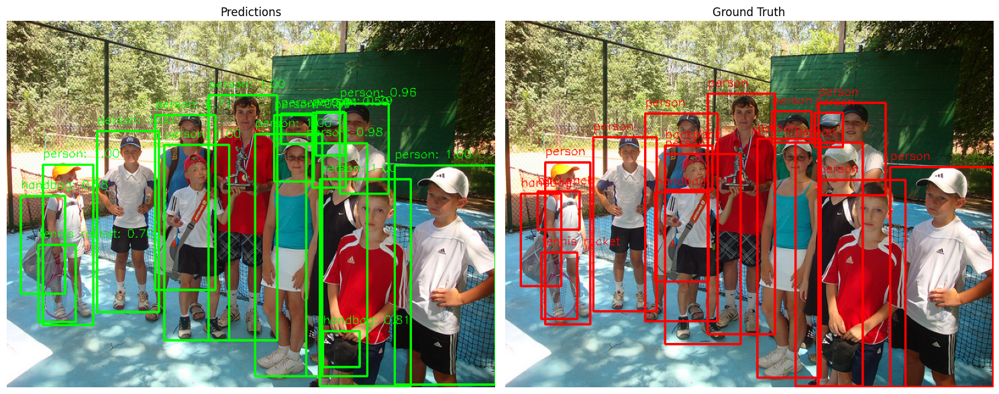

Средние метрики для изображения: IoU: 0.000, Precision: 0.000, Recall: 0.000
Обнаружено объектов: 17
Классы предсказаний: ['person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'handbag', 'person', 'person', 'tennis racket', 'person', 'person', 'person', 'handbag']
Ground truth объектов: 17
Классы GT: ['tennis racket', 'handbag', 'handbag', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'backpack', 'backpack', 'person', 'person']

--- Обработка изображения 6/20 ---
Изображение: 000000310862.jpg


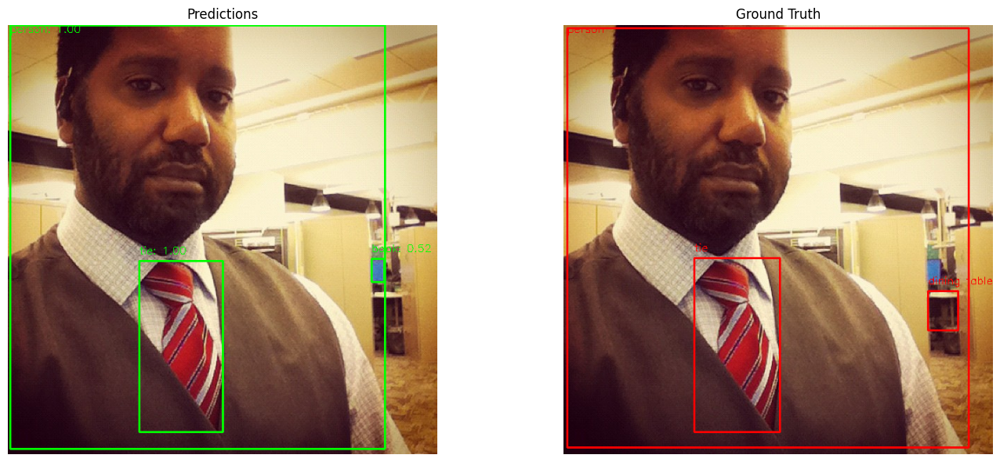

Средние метрики для изображения: IoU: 0.934, Precision: 0.971, Recall: 0.961
Обнаружено объектов: 3
Классы предсказаний: ['person', 'tie', 'book']
Ground truth объектов: 3
Классы GT: ['tie', 'person', 'dining table']

--- Обработка изображения 7/20 ---
Изображение: 000000000872.jpg


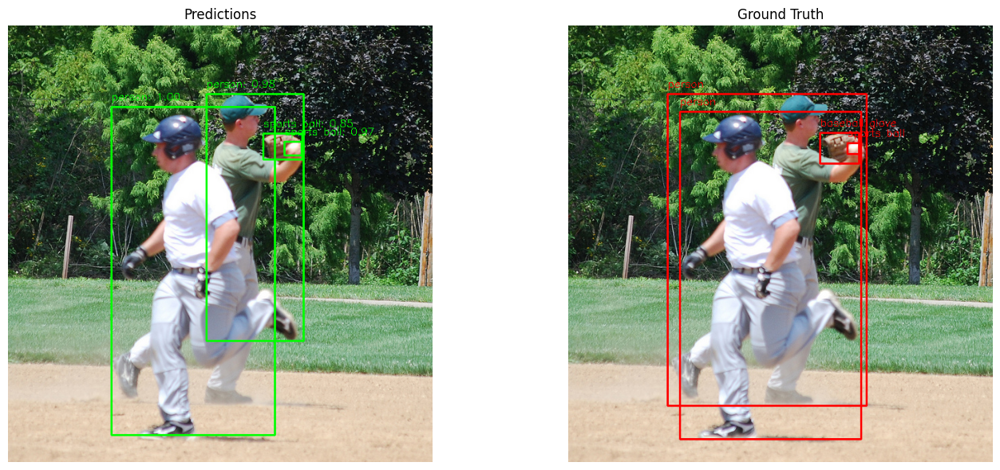

Средние метрики для изображения: IoU: 0.648, Precision: 0.797, Recall: 0.800
Обнаружено объектов: 4
Классы предсказаний: ['person', 'person', 'sports ball', 'sports ball']
Ground truth объектов: 4
Классы GT: ['sports ball', 'person', 'person', 'baseball glove']

--- Обработка изображения 8/20 ---
Изображение: 000000013659.jpg


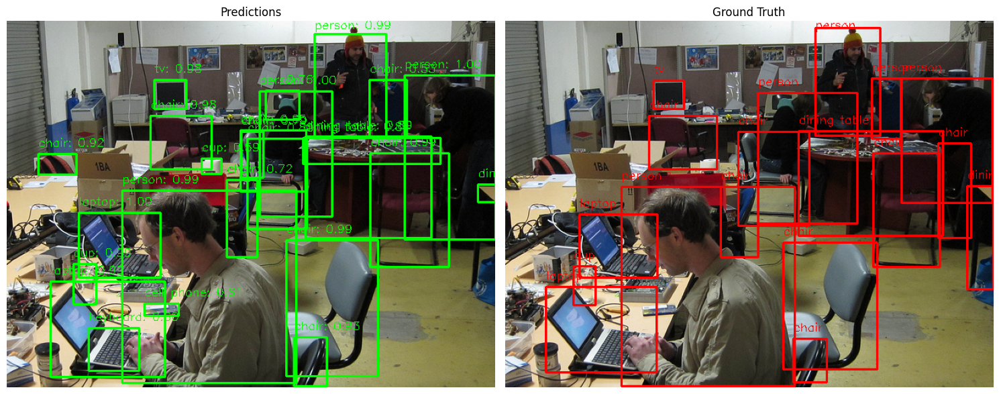

Средние метрики для изображения: IoU: 0.016, Precision: 0.021, Recall: 0.063
Обнаружено объектов: 25
Классы предсказаний: ['laptop', 'person', 'person', 'laptop', 'person', 'cup', 'person', 'chair', 'chair', 'chair', 'tv', 'chair', 'chair', 'dining table', 'dining table', 'chair', 'chair', 'dining table', 'tv', 'chair', 'chair', 'cell phone', 'keyboard', 'cup', 'chair']
Ground truth объектов: 18
Классы GT: ['chair', 'chair', 'chair', 'chair', 'chair', 'dining table', 'dining table', 'person', 'person', 'person', 'person', 'laptop', 'laptop', 'cup', 'tv', 'chair', 'chair', 'person']

--- Обработка изображения 9/20 ---
Изображение: 000000021879.jpg


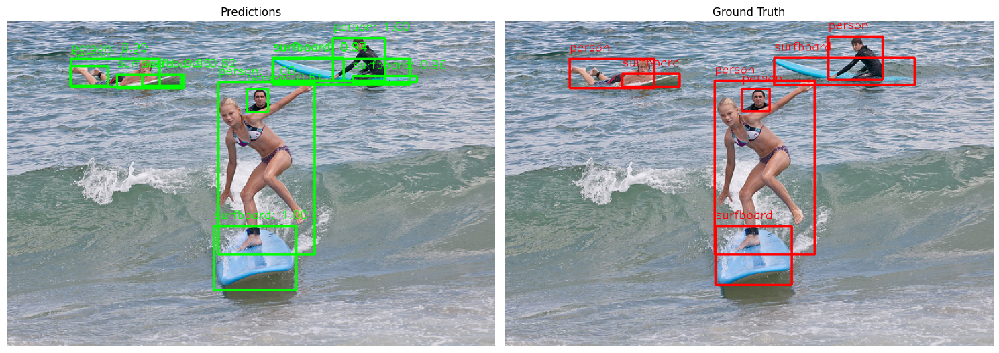

Средние метрики для изображения: IoU: 0.519, Precision: 0.637, Recall: 0.554
Обнаружено объектов: 11
Классы предсказаний: ['person', 'person', 'surfboard', 'person', 'surfboard', 'surfboard', 'surfboard', 'surfboard', 'surfboard', 'person', 'person']
Ground truth объектов: 7
Классы GT: ['person', 'person', 'person', 'person', 'surfboard', 'surfboard', 'surfboard']

--- Обработка изображения 10/20 ---
Изображение: 000000407083.jpg


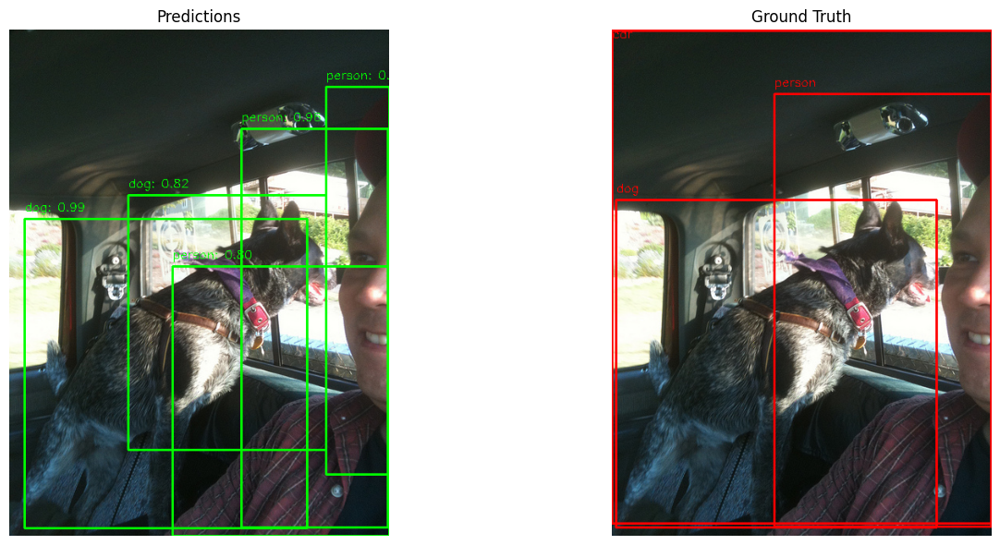

Средние метрики для изображения: IoU: 0.716, Precision: 0.962, Recall: 0.739
Обнаружено объектов: 5
Классы предсказаний: ['dog', 'person', 'dog', 'person', 'person']
Ground truth объектов: 3
Классы GT: ['dog', 'person', 'car']

--- Обработка изображения 11/20 ---
Изображение: 000000167240.jpg


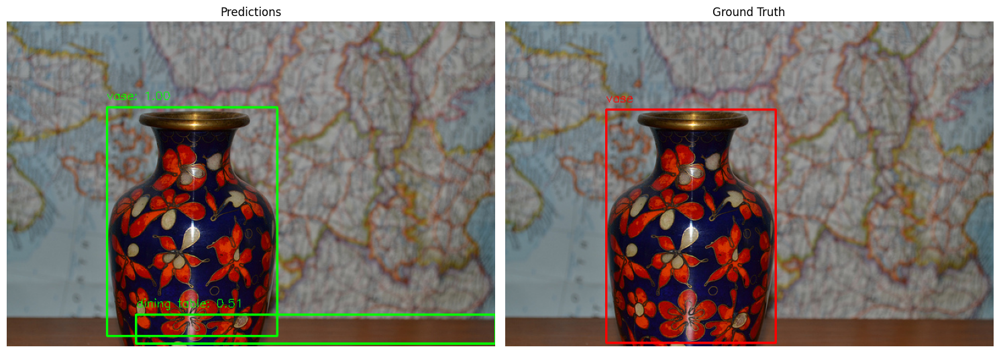

Средние метрики для изображения: IoU: 0.472, Precision: 0.490, Recall: 0.483
Обнаружено объектов: 2
Классы предсказаний: ['vase', 'dining table']
Ground truth объектов: 1
Классы GT: ['vase']

--- Обработка изображения 12/20 ---
Изображение: 000000505789.jpg


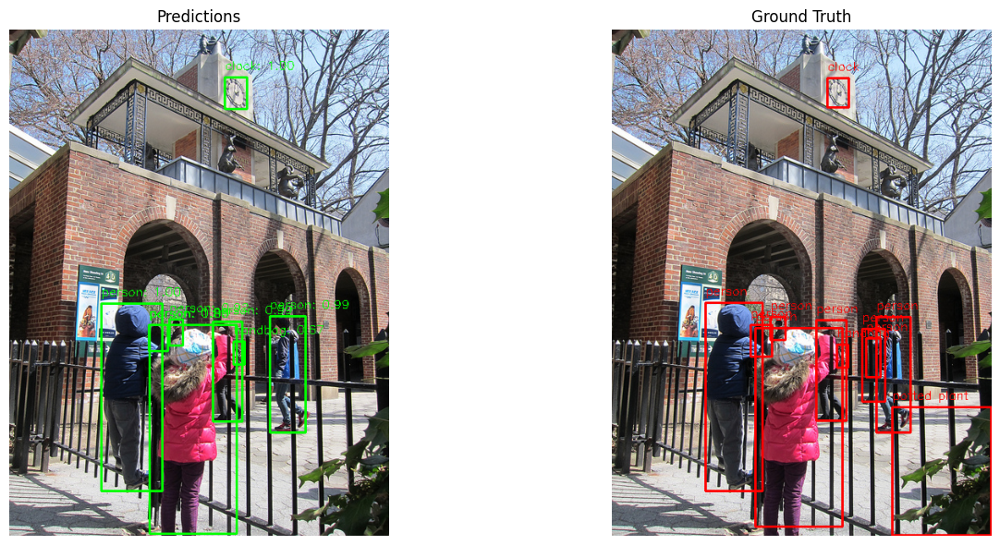

Средние метрики для изображения: IoU: 0.866, Precision: 0.898, Recall: 0.961
Обнаружено объектов: 8
Классы предсказаний: ['person', 'person', 'clock', 'person', 'person', 'person', 'person', 'handbag']
Ground truth объектов: 11
Классы GT: ['clock', 'person', 'person', 'person', 'person', 'person', 'person', 'handbag', 'potted plant', 'person', 'person']

--- Обработка изображения 13/20 ---
Изображение: 000000142971.jpg


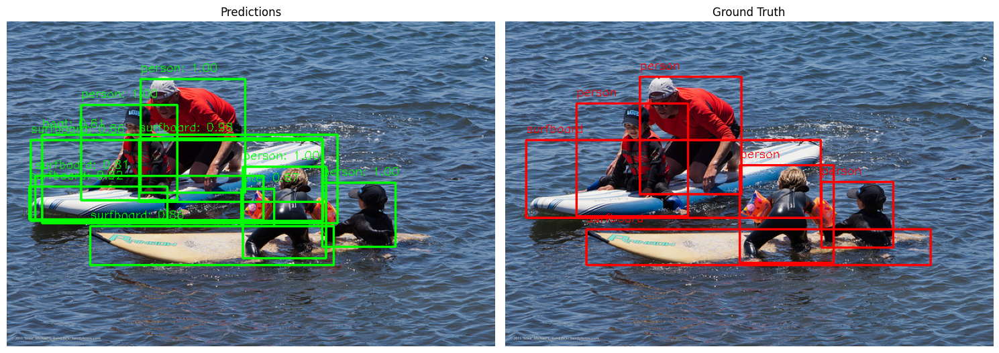

Средние метрики для изображения: IoU: 0.874, Precision: 0.932, Recall: 0.932
Обнаружено объектов: 11
Классы предсказаний: ['person', 'person', 'person', 'person', 'surfboard', 'surfboard', 'surfboard', 'surfboard', 'surfboard', 'kite', 'boat']
Ground truth объектов: 6
Классы GT: ['person', 'person', 'person', 'surfboard', 'surfboard', 'person']

--- Обработка изображения 14/20 ---
Изображение: 000000270705.jpg


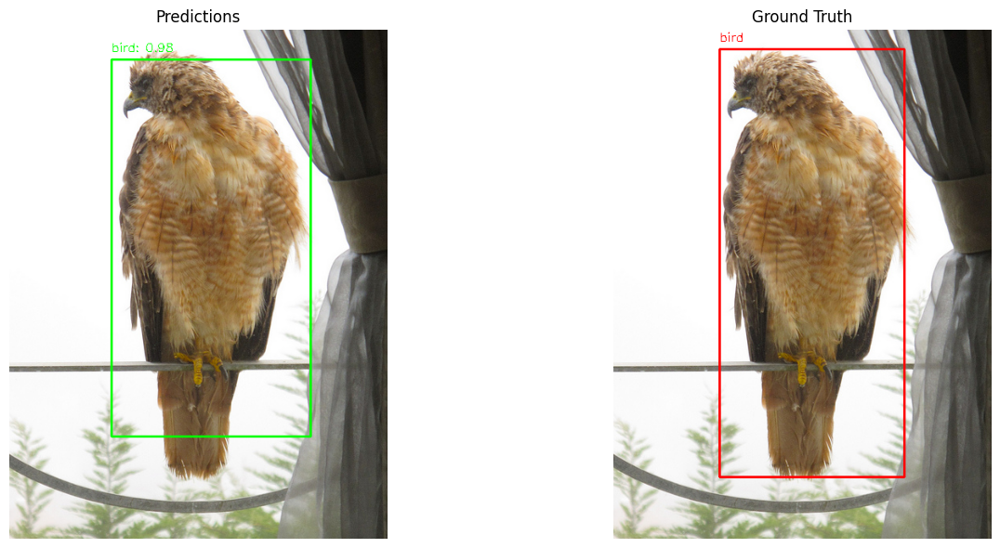

Средние метрики для изображения: IoU: 0.883, Precision: 0.966, Recall: 0.911
Обнаружено объектов: 1
Классы предсказаний: ['bird']
Ground truth объектов: 1
Классы GT: ['bird']

--- Обработка изображения 15/20 ---
Изображение: 000000185473.jpg


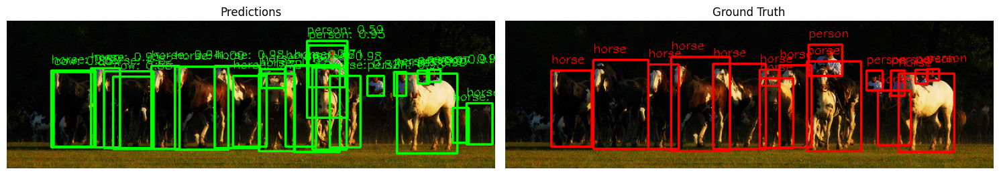

Средние метрики для изображения: IoU: 0.772, Precision: 0.916, Recall: 0.838
Обнаружено объектов: 24
Классы предсказаний: ['horse', 'horse', 'horse', 'person', 'horse', 'person', 'person', 'person', 'horse', 'horse', 'horse', 'person', 'horse', 'cow', 'horse', 'horse', 'horse', 'horse', 'horse', 'horse', 'horse', 'person', 'cow', 'horse']
Ground truth объектов: 16
Классы GT: ['horse', 'horse', 'horse', 'horse', 'horse', 'horse', 'person', 'person', 'person', 'person', 'person', 'horse', 'horse', 'horse', 'horse', 'horse']

--- Обработка изображения 16/20 ---
Изображение: 000000213035.jpg


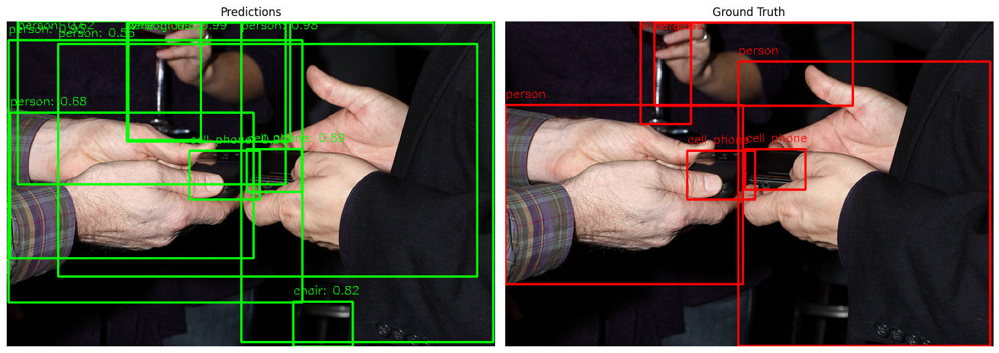

Средние метрики для изображения: IoU: 0.303, Precision: 0.316, Recall: 0.375
Обнаружено объектов: 10
Классы предсказаний: ['wine glass', 'cell phone', 'person', 'person', 'cell phone', 'person', 'chair', 'person', 'person', 'person']
Ground truth объектов: 6
Классы GT: ['cell phone', 'cell phone', 'person', 'person', 'wine glass', 'person']

--- Обработка изображения 17/20 ---
Изображение: 000000371552.jpg


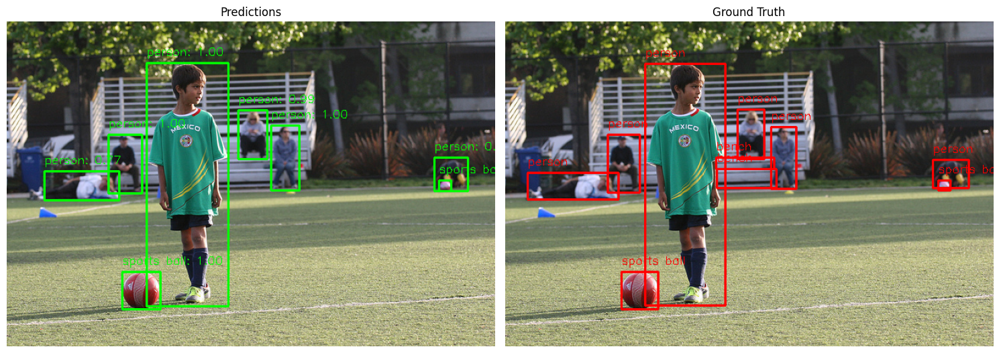

Средние метрики для изображения: IoU: 0.937, Precision: 0.938, Recall: 0.999
Обнаружено объектов: 8
Классы предсказаний: ['person', 'sports ball', 'person', 'person', 'person', 'sports ball', 'person', 'person']
Ground truth объектов: 10
Классы GT: ['sports ball', 'person', 'person', 'person', 'sports ball', 'person', 'person', 'person', 'bench', 'bench']

--- Обработка изображения 18/20 ---
Изображение: 000000522393.jpg


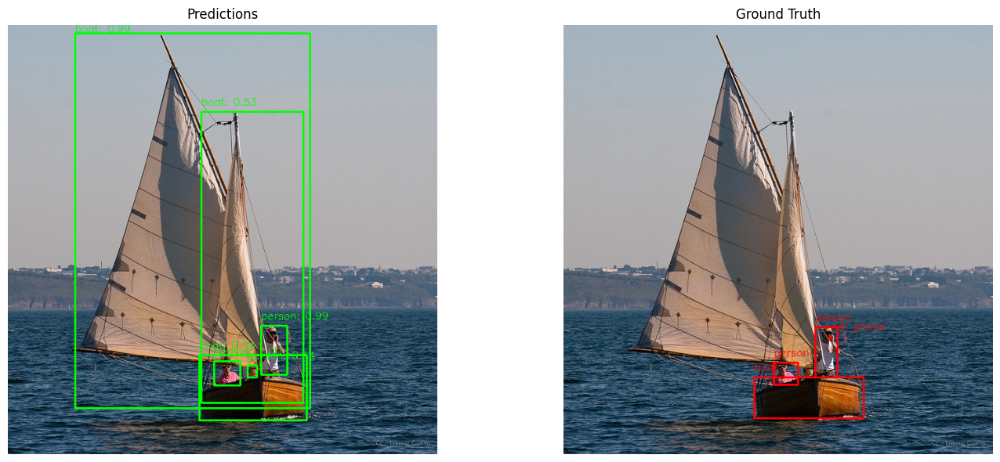

Средние метрики для изображения: IoU: 0.272, Precision: 0.321, Recall: 0.594
Обнаружено объектов: 6
Классы предсказаний: ['person', 'boat', 'person', 'boat', 'person', 'boat']
Ground truth объектов: 4
Классы GT: ['boat', 'person', 'cell phone', 'person']

--- Обработка изображения 19/20 ---
Изображение: 000000401862.jpg


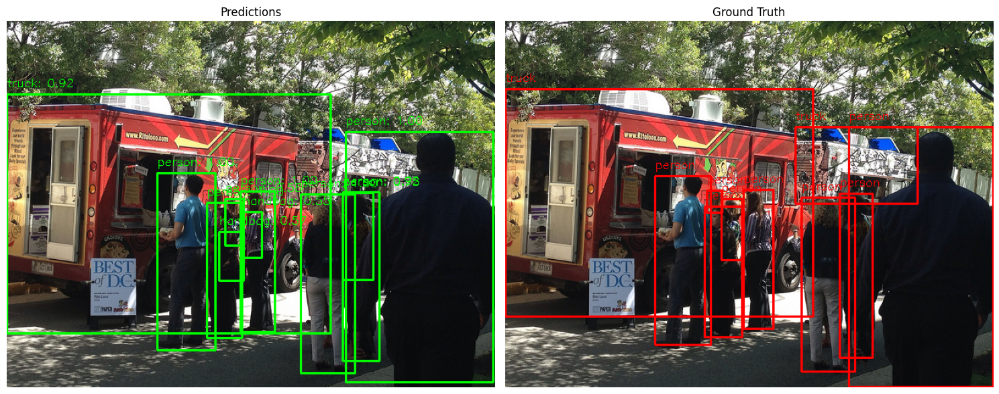

Средние метрики для изображения: IoU: 0.431, Precision: 0.466, Recall: 0.461
Обнаружено объектов: 11
Классы предсказаний: ['person', 'person', 'person', 'person', 'person', 'truck', 'person', 'person', 'person', 'handbag', 'handbag']
Ground truth объектов: 10
Классы GT: ['truck', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'person', 'truck']

--- Обработка изображения 20/20 ---
Изображение: 000000214753.jpg


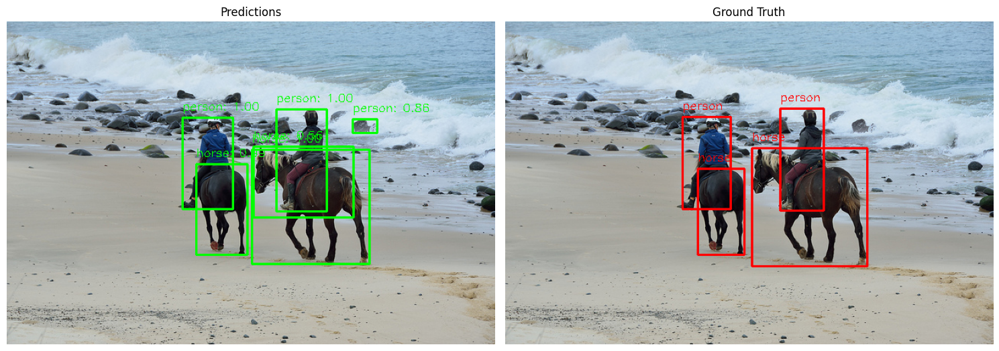

Средние метрики для изображения: IoU: 0.572, Precision: 0.595, Recall: 0.673
Обнаружено объектов: 6
Классы предсказаний: ['person', 'person', 'horse', 'horse', 'person', 'horse']
Ground truth объектов: 4
Классы GT: ['horse', 'person', 'person', 'horse']

СВОДНАЯ СТАТИСТИКА ПО 20 ИЗОБРАЖЕНИЯМ
Средний IoU: 0.626 (±0.350)
Медиана IoU: 0.804
Min IoU: 0.000, Max IoU: 0.945
Средняя Precision: 0.706 (±0.375)
Средняя Recall: 0.730 (±0.344)
Всего вычислено метрик: 44 IoU, 44 Precision, 44 Recall


In [40]:
# 2.5 Оценка модели и визуализация результатов - инференс
# Списки для хранения метрик
all_ious = []
all_precisions = []
all_recalls = []

# Загрузка категорий COCO и создание словаря
categories = coco.loadCats(coco.getCatIds())
categories_dict = {cat['id']: cat['name'] for cat in categories}
category_names_list = [cat['name'] for cat in categories]

print(f"Загружено категорий: {len(categories_dict)}")
print(f"Примеры категорий: {list(categories_dict.items())[:5]}")

# Анализ на 20 изображениях
for i, image_id in enumerate(selected_image_ids[:20]):
    print(f"\n--- Обработка изображения {i+1}/20 ---")

    # Получение информации об изображении
    image_info = coco.loadImgs(image_id)[0]
    image_path = os.path.join(image_dir, image_info['file_name'])

    print(f"Изображение: {image_info['file_name']}")

    # Предобработка изображения
    image_tensor, original_image = preprocess_image(image_path)

    # Получение предсказаний
    predictions = get_predictions(model, image_tensor, device)
    filtered_predictions = filter_predictions(predictions, confidence_threshold=0.5)

    # Получение ground truth
    gt_masks, gt_boxes, gt_categories = get_ground_truth_masks(coco, image_id)

    # Визуализация результатов
    visualize_results(original_image, filtered_predictions, gt_masks, gt_boxes, gt_categories)

    # Вычисление метрик для этого изображения
    image_ious = []
    image_precisions = []
    image_recalls = []

    if len(filtered_predictions['masks']) > 0 and len(gt_masks) > 0:
        # Сравниваем каждую предсказанную маску с каждой GT маской
        for pred_idx in range(min(3, len(filtered_predictions['masks']))):  # Ограничиваем для скорости
            pred_mask = filtered_predictions['masks'][pred_idx].cpu().numpy().squeeze()
            pred_mask_binary = (pred_mask > 0.5).astype(np.uint8)

            # Находим лучшую совпадающую GT маску
            best_iou = 0
            best_precision = 0
            best_recall = 0

            for gt_idx in range(min(3, len(gt_masks))):  # Ограничиваем для скорости
                gt_mask = gt_masks[gt_idx]

                # Вычисление IoU
                iou = calculate_iou(pred_mask_binary, gt_mask)
                if iou > best_iou:
                    best_iou = iou

                # Вычисление Precision и Recall на уровне пикселей
                y_true = gt_mask.flatten()
                y_pred = pred_mask_binary.flatten()

                if len(np.unique(y_true)) > 1:  # Проверяем, что есть и объект и фон
                    precision = precision_score(y_true, y_pred, zero_division=0)
                    recall = recall_score(y_true, y_pred, zero_division=0)

                    if precision + recall > best_precision + best_recall:
                        best_precision = precision
                        best_recall = recall

            if best_iou > 0:
                image_ious.append(best_iou)
            if best_precision > 0:
                image_precisions.append(best_precision)
            if best_recall > 0:
                image_recalls.append(best_recall)

    # Добавляем средние значения по изображению в общие списки
    if image_ious:
        all_ious.extend(image_ious)
        avg_iou = np.mean(image_ious)
    else:
        avg_iou = 0

    if image_precisions:
        all_precisions.extend(image_precisions)
        avg_precision = np.mean(image_precisions)
    else:
        avg_precision = 0

    if image_recalls:
        all_recalls.extend(image_recalls)
        avg_recall = np.mean(image_recalls)
    else:
        avg_recall = 0

    print(f"Средние метрики для изображения: IoU: {avg_iou:.3f}, Precision: {avg_precision:.3f}, Recall: {avg_recall:.3f}")

    # Информация о детекциях
    pred_classes = [get_category_name(label, categories_dict) for label in filtered_predictions['labels'].cpu().numpy()]
    gt_classes = [get_category_name(cat_id, categories_dict) for cat_id in gt_categories]

    print(f"Обнаружено объектов: {len(filtered_predictions['boxes'])}")
    if pred_classes:
        print(f"Классы предсказаний: {pred_classes}")
    print(f"Ground truth объектов: {len(gt_boxes)}")
    if gt_classes:
        print(f"Классы GT: {gt_classes}")

# Вывод суммарной статистики
print("\n" + "="*50)
print("СВОДНАЯ СТАТИСТИКА ПО 20 ИЗОБРАЖЕНИЯМ")
print("="*50)

if all_ious:
    print(f"Средний IoU: {np.mean(all_ious):.3f} (±{np.std(all_ious):.3f})")
    print(f"Медиана IoU: {np.median(all_ious):.3f}")
    print(f"Min IoU: {np.min(all_ious):.3f}, Max IoU: {np.max(all_ious):.3f}")
else:
    print("IoU: нет данных")

if all_precisions:
    print(f"Средняя Precision: {np.mean(all_precisions):.3f} (±{np.std(all_precisions):.3f})")
else:
    print("Precision: нет данных")

if all_recalls:
    print(f"Средняя Recall: {np.mean(all_recalls):.3f} (±{np.std(all_recalls):.3f})")
else:
    print("Recall: нет данных")

print(f"Всего вычислено метрик: {len(all_ious)} IoU, {len(all_precisions)} Precision, {len(all_recalls)} Recall")

#### 2.6 Исследование параметров маски и confidence

Проведите серию экспериментов: протестируйте разные значения mask_threshold (0.3, 0.5, 0.7), протестируйте разные значения confidence_threshold, найдите оптимальное значение, при котором достигается лучший баланс между точностью и полнотой:


In [41]:
# 2.6 Исследование параметров маски и confidence
def evaluate_thresholds(confidence_thresholds, mask_thresholds):
    """Исследование влияния пороговых значений на качество"""
    results = []

    for conf_thresh in confidence_thresholds:
        for mask_thresh in mask_thresholds:
            print(f"Testing confidence={conf_thresh}, mask_threshold={mask_thresh}")

            ious = []
            precisions = []
            recalls = []
            detected_objects = []

            for image_id in selected_image_ids[:3]:  # Тестируем на 3 изображениях для скорости
                image_info = coco.loadImgs(image_id)[0]
                image_path = os.path.join(image_dir, image_info['file_name'])

                image_tensor, _ = preprocess_image(image_path)
                predictions = get_predictions(model, image_tensor, device)
                filtered_predictions = filter_predictions(predictions, conf_thresh)

                gt_masks, _, _ = get_ground_truth_masks(coco, image_id)

                detected_objects.append(len(filtered_predictions['boxes']))

                if len(filtered_predictions['masks']) > 0 and len(gt_masks) > 0:
                    # Берем первую маску для сравнения
                    pred_mask = filtered_predictions['masks'][0].cpu().numpy().squeeze()
                    pred_mask_binary = (pred_mask > mask_thresh).astype(np.uint8)
                    gt_mask = gt_masks[0]

                    iou = calculate_iou(pred_mask_binary, gt_mask)
                    ious.append(iou)

                    y_true = gt_mask.flatten()
                    y_pred = pred_mask_binary.flatten()

                    if len(np.unique(y_true)) > 1:
                        precision = precision_score(y_true, y_pred, zero_division=0)
                        recall = recall_score(y_true, y_pred, zero_division=0)
                        precisions.append(precision)
                        recalls.append(recall)

            if ious:
                avg_iou = np.mean(ious)
                avg_precision = np.mean(precisions) if precisions else 0
                avg_recall = np.mean(recalls) if recalls else 0
                avg_detected = np.mean(detected_objects)

                results.append({
                    'confidence_threshold': conf_thresh,
                    'mask_threshold': mask_thresh,
                    'avg_iou': avg_iou,
                    'avg_precision': avg_precision,
                    'avg_recall': avg_recall,
                    'avg_detected_objects': avg_detected
                })

                print(f"Results: IoU={avg_iou:.3f}, Precision={avg_precision:.3f}, Recall={avg_recall:.3f}, Detected={avg_detected:.1f}")
            else:
                print("No valid predictions for threshold combination")

    return results

# Параметры для исследования
confidence_thresholds = [0.3, 0.5, 0.7]
mask_thresholds = [0.3, 0.5, 0.7]

# Запуск исследования
print("Запуск исследования параметров...")
threshold_results = evaluate_thresholds(confidence_thresholds, mask_thresholds)

# Вывод результатов исследования
print("\n" + "="*60)
print("РЕЗУЛЬТАТЫ ИССЛЕДОВАНИЯ ПАРАМЕТРОВ")
print("="*60)
print("Confidence | Mask | IoU | Precision | Recall | Detected")
print("-" * 60)
for result in threshold_results:
    print(f"{result['confidence_threshold']:10.1f} | {result['mask_threshold']:4.1f} | "
          f"{result['avg_iou']:.3f} | {result['avg_precision']:9.3f} | "
          f"{result['avg_recall']:6.3f} | {result['avg_detected_objects']:8.1f}")

# Нахождение оптимальных параметров
if threshold_results:
    best_iou = max(threshold_results, key=lambda x: x['avg_iou'])
    best_balance = max(threshold_results, key=lambda x: x['avg_precision'] + x['avg_recall'])

    print(f"\nЛучший IoU: confidence={best_iou['confidence_threshold']}, mask={best_iou['mask_threshold']}")
    print(f"Лучший баланс Precision/Recall: confidence={best_balance['confidence_threshold']}, mask={best_balance['mask_threshold']}")

Запуск исследования параметров...
Testing confidence=0.3, mask_threshold=0.3
Results: IoU=0.595, Precision=0.602, Recall=0.657, Detected=6.7
Testing confidence=0.3, mask_threshold=0.5
Results: IoU=0.605, Precision=0.633, Recall=0.636, Detected=6.7
Testing confidence=0.3, mask_threshold=0.7
Results: IoU=0.591, Precision=0.653, Recall=0.602, Detected=6.7
Testing confidence=0.5, mask_threshold=0.3
Results: IoU=0.595, Precision=0.602, Recall=0.657, Detected=4.3
Testing confidence=0.5, mask_threshold=0.5
Results: IoU=0.605, Precision=0.633, Recall=0.636, Detected=4.3
Testing confidence=0.5, mask_threshold=0.7
Results: IoU=0.591, Precision=0.653, Recall=0.602, Detected=4.3
Testing confidence=0.7, mask_threshold=0.3
Results: IoU=0.595, Precision=0.602, Recall=0.657, Detected=3.0
Testing confidence=0.7, mask_threshold=0.5
Results: IoU=0.605, Precision=0.633, Recall=0.636, Detected=3.0
Testing confidence=0.7, mask_threshold=0.7
Results: IoU=0.591, Precision=0.653, Recall=0.602, Detected=3.0

РЕ